In [1]:
# import absl.logging
# absl.logging.set_verbosity(absl.logging.ERROR)

import tensorflow as tf
from tensorflow import keras
#import tensorflow_addons as tfa
import pickle

from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.models import load_model

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import metrics
%matplotlib inline
print(tf.__version__)

2.18.0


In [2]:
## For Mu

In [2]:
df = pd.read_excel('../Descriptors/withDescriptors_DFT_D3_ACS_AMI_348_hetero_Mu.xlsx')

In [3]:
duplicate_columns = []
checked = set()

for col1 in df.columns:
    if col1 in checked:
        continue
    for col2 in df.columns:
        if col1 != col2 and col2 not in checked and df[col1].equals(df[col2]):
            duplicate_columns.append((col1, col2))
            checked.add(col2)

if duplicate_columns:
    print("Duplicate columns with identical values:")
    for col1, col2 in duplicate_columns:
        print(f"'{col1}' is identical to '{col2}'")
else:
    print("No duplicate columns found.")
    
## remove duplicates
    
unique_columns = []
seen = set()

for col in df.columns:
    col_values = tuple(df[col])  # Convert column values to a tuple (hashable)
    if col_values not in seen:
        seen.add(col_values)
        unique_columns.append(col)  # Keep the first occurrence

df_columns_compared = df[unique_columns]

df_columns_compared.to_excel("STEP2_withDescriptors_DFT_D3_ACS_AMI_348_hetero_Mu_removed_duplicate_columns.xlsx", index=False)

Duplicate columns with identical values:
'min_diff_vdw_radius' is identical to 'min_diff_covalent_radius'
'min_diff_vdw_radius' is identical to 'min_diff_atomic_radius'
'min_diff_vdw_radius' is identical to 'min_diff_atomic_volume'
'min_diff_vdw_radius' is identical to 'min_diff_dipole_polarizability'
'min_diff_vdw_radius' is identical to 'delta_x18x914_avg_val_electrons'
'min_diff_vdw_radius' is identical to 'min_diff_val_electrons'
'min_diff_vdw_radius' is identical to 'delta_x18x914_avg_unp_electrons'
'min_diff_vdw_radius' is identical to 'min_diff_unp_electrons'
'min_diff_vdw_radius' is identical to 'min_diff_ion_energies'
'min_diff_vdw_radius' is identical to 'min_diff_no_electrons'
'min_diff_vdw_radius' is identical to 'min_diff_electronegativity'
'min_diff_vdw_radius' is identical to 'min_electron_affinity'
'min_diff_vdw_radius' is identical to 'min_diff_electron_affinity'
'min_diff_vdw_radius' is identical to 'min_diff_period'
'min_diff_vdw_radius' is identical to 'min_diff_den

In [4]:
same_value_columns_within = [col for col in df_columns_compared.columns if df_columns_compared[col].nunique() == 1]

print("Columns with all identical values:\n", same_value_columns_within)

df_same_value_columns_within_removed = df_columns_compared.loc[:, df_columns_compared.nunique() > 1]

df_same_value_columns_within_removed.to_excel("STEP3_withDescriptors_DFT_D3_ACS_AMI_348_hetero_Mu_same_value_columns_within_removed.xlsx", index=False)

Columns with all identical values:
 ['min_diff_vdw_radius', 'max_x_val_electrons', 'max_x_unp_electrons']


In [5]:
X_mu = df_same_value_columns_within_removed.drop(columns=['material','spin_state','formation_energy','Ef_per_cell','bandgap','mag_mom_table','sitewise_axiswise_tot_mu',
                                  'sitewise_mu_mag','axiswise_tot_mu','total_mag','Mu_per_cell','MBT','BT','MBT_BT_combined','chemical_composition'])
y_mu = df_same_value_columns_within_removed['Mu_per_cell']

In [6]:
## scatter plots of all the descriptors

# i,j = 0,0
# plots_per_row = 5
# #fig,axes = plt.subplots(int(X_mu.shape[1]/plots_per_row),plots_per_row,figsize=(20,20),sharey=True)
# fig,axes = plt.subplots(round(X_mu.shape[1]/plots_per_row),plots_per_row,figsize=(20,640),sharey=True)

# for col in X_mu.columns:
#     axes[i][j].scatter(X_mu[col],y_mu)#,label=str(col))
#     axes[i][j].set_xlabel(str(col))
#     axes[i][j].set_ylabel('Mu per cell')
# #    axes[i,j].legend()
    
#     j+=1
    
#     if j%plots_per_row == 0:
#         i+=1
#         j=0
# plt.show()

In [7]:
## Calculate MIC to see the connection of features with the magnetic moment

In [8]:
from minepy import MINE

mine = MINE()

mic_scores = {}
for col in X_mu.columns:
    mine.compute_score(X_mu[col], y_mu)
    mic_scores[col] = mine.mic()

mic_df = pd.DataFrame(list(mic_scores.items()), columns=['Feature', 'MIC']).sort_values(by='MIC', ascending=False)

In [48]:
df_same_value_columns_within_removed[mic_df[mic_df['MIC']>=0.20]['Feature']].to_excel('STEP4_withDescriptors_after_removing_duplicates_MIC_0.20.xlsx', index=False)
df_same_value_columns_within_removed[mic_df[mic_df['MIC']>=0.30]['Feature']].to_excel('STEP4_withDescriptors_after_removing_duplicates_MIC_0.30.xlsx', index=False)
df_same_value_columns_within_removed[mic_df[mic_df['MIC']>=0.35]['Feature']].to_excel('STEP4_withDescriptors_after_removing_duplicates_MIC_0.35.xlsx', index=False)
df_same_value_columns_within_removed[mic_df[mic_df['MIC']>=0.40]['Feature']].to_excel('STEP4_withDescriptors_after_removing_duplicates_MIC_0.40.xlsx', index=False)
df_same_value_columns_within_removed[mic_df[mic_df['MIC']>=0.50]['Feature']].to_excel('STEP4_withDescriptors_after_removing_duplicates_MIC_0.50.xlsx', index=False)

In [9]:
df_same_value_columns_within_removed[mic_df[mic_df['MIC']>=0.35]['Feature']]

,delta_a1a2_mendeleev_number,delta_a1a2_val_electrons,avg_a12x914_unp_electrons,avg_a12x18_unp_electrons,delta_a12x18_avg_unp_electrons,avg_a1a2_unp_electrons,delta_a1a2_unp_electrons,min_unp_electrons,delta_a1a2_electronegativity,avg_a1a2_lattice_constant,...,avg_a12x914_electronegativity,avg_a12x18_metallic_radius,std_proton_affinity,avg_proton_affinity,avg_a12b58_atomic_volume,avg_a12b58_electronegativity,delta_b14x914_avg_melting_point,delta_b14x18_avg_dipole_polarizability,delta_b14x914_avg_atomic_radius,delta_b14x914_avg_density
0,44,4,2.250,2.2,1.0,3.0,4,1,0.19,6.100,...,1.93875,119.8,237.088281,71.304167,14.598333,1.791667,178.20,19.1,20,3.558
1,43,4,2.250,2.2,1.0,3.0,4,1,0.33,6.270,...,1.92125,121.6,245.040659,73.512500,15.398333,1.768333,181.20,14.1,5,0.448
2,17,4,2.250,2.2,1.0,3.0,4,1,0.38,6.490,...,2.01000,134.8,159.321520,33.220833,13.815000,1.886667,181.20,5.0,5,0.448
3,9,2,2.500,2.4,2.0,4.0,2,2,0.73,6.345,...,2.39125,107.5,340.573814,286.654167,13.481667,1.945000,413.90,23.6,30,1.871
4,11,3,2.375,2.3,1.5,3.5,3,2,0.22,6.060,...,1.93500,135.9,159.321520,33.220833,15.848333,1.846667,122.05,9.0,40,5.068
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
343,23,5,2.125,2.1,0.5,2.5,5,0,0.14,5.935,...,1.98000,135.2,159.321520,33.220833,15.681667,1.906667,181.20,5.0,5,0.448
344,7,2,2.750,2.6,3.0,5.0,0,2,0.05,6.095,...,1.96875,134.8,159.321520,33.220833,15.298333,1.891667,122.05,9.0,40,5.068
345,5,1,2.625,2.5,2.5,4.5,1,2,0.65,5.795,...,2.40375,117.9,328.874779,231.545833,16.815000,1.891667,517.90,14.1,45,4.610
346,43,4,2.250,2.2,1.0,3.0,4,1,0.33,6.270,...,1.92125,137.6,245.040659,73.512500,18.731667,1.728333,181.20,5.0,5,0.448


In [11]:
df_same_value_columns_within_removed[mic_df[mic_df['MIC']>=0.35]['Feature']].columns

Index(['delta_a1a2_mendeleev_number', 'delta_a1a2_val_electrons',
       'avg_a12x914_unp_electrons', 'avg_a12x18_unp_electrons',
       'delta_a12x18_avg_unp_electrons', 'avg_a1a2_unp_electrons',
       'delta_a1a2_unp_electrons', 'min_unp_electrons',
       'delta_a1a2_electronegativity', 'avg_a1a2_lattice_constant',
       ...
       'avg_a12x914_electronegativity', 'avg_a12x18_metallic_radius',
       'std_proton_affinity', 'avg_proton_affinity',
       'avg_a12b58_atomic_volume', 'avg_a12b58_electronegativity',
       'delta_b14x914_avg_melting_point',
       'delta_b14x18_avg_dipole_polarizability',
       'delta_b14x914_avg_atomic_radius', 'delta_b14x914_avg_density'],
      dtype='object', length=240)

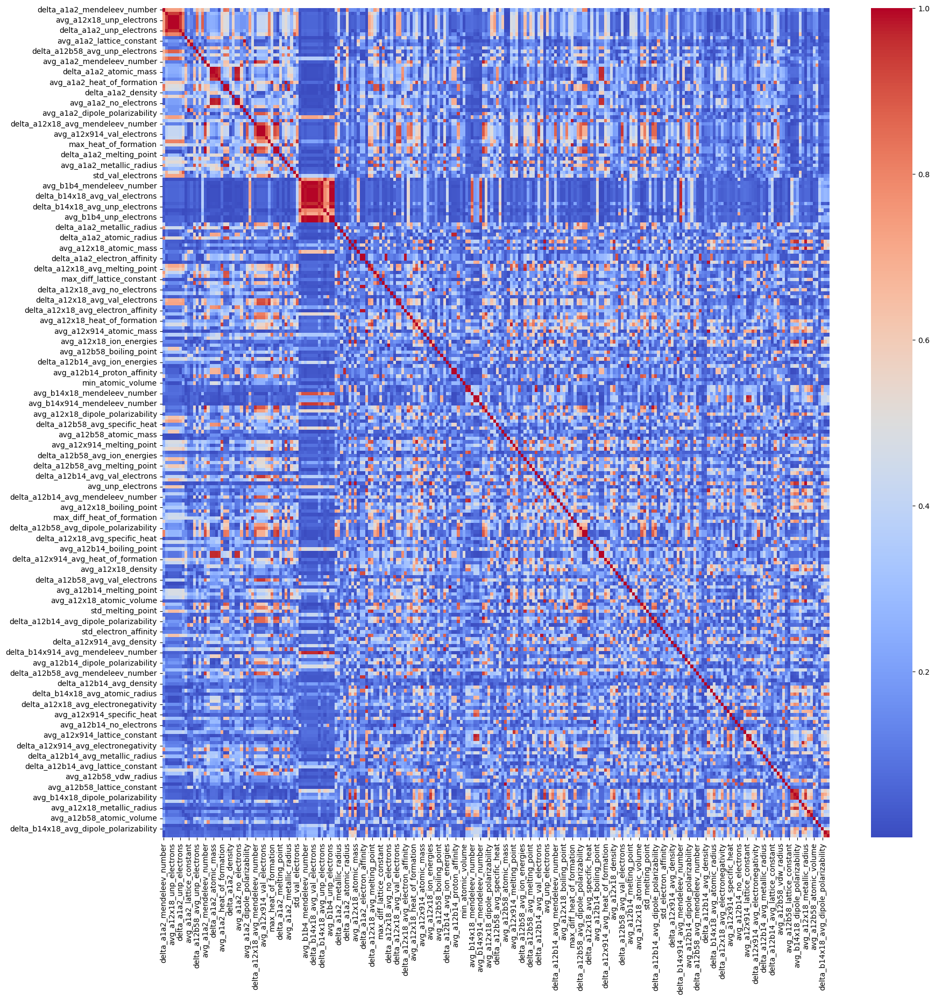

In [15]:
X_mu = df_same_value_columns_within_removed[mic_df[mic_df['MIC']>=0.35]['Feature']]

corr_matrix = X_mu.corr().abs()
plt.figure(figsize=(20,20))
sns.heatmap(corr_matrix, cmap='coolwarm')
plt.savefig('corr.png',dpi=600)

In [36]:
X_mu.corr().to_excel('Correlation_Matrix.xlsx',index=True)

In [39]:
corr_matrix = X_mu.corr()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i,j]) > 0.95:
            print('PCC between ', corr_matrix.columns[i], ' and ', corr_matrix.columns[j], ' = ',corr_matrix.iloc[i,j])
            col_name = corr_matrix.columns[i]
            print(col_name,' will be dropped.')
            print('=========================')
            print('=========================')

PCC between  avg_a12x18_unp_electrons  and  avg_a12x914_unp_electrons  =  0.999999999999999
avg_a12x18_unp_electrons  will be dropped.
PCC between  delta_a12x18_avg_unp_electrons  and  avg_a12x914_unp_electrons  =  1.0000000000000002
delta_a12x18_avg_unp_electrons  will be dropped.
PCC between  delta_a12x18_avg_unp_electrons  and  avg_a12x18_unp_electrons  =  0.9999999999999994
delta_a12x18_avg_unp_electrons  will be dropped.
PCC between  avg_a1a2_unp_electrons  and  avg_a12x914_unp_electrons  =  1.0000000000000004
avg_a1a2_unp_electrons  will be dropped.
PCC between  avg_a1a2_unp_electrons  and  avg_a12x18_unp_electrons  =  0.9999999999999994
avg_a1a2_unp_electrons  will be dropped.
PCC between  avg_a1a2_unp_electrons  and  delta_a12x18_avg_unp_electrons  =  1.0000000000000002
avg_a1a2_unp_electrons  will be dropped.
PCC between  delta_a1a2_unp_electrons  and  delta_a1a2_val_electrons  =  0.9823659591049272
delta_a1a2_unp_electrons  will be dropped.
PCC between  delta_a1a2_atomic_mass

In [18]:
# ##IMPORTANT##

# # script to calculate the pearson correlation and filter out the correlated duplicates

def correlation(dataset, threshold):
    col_corr = set()  ## test with list as well to see the difference
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i,j]) > threshold:
                col_name = corr_matrix.columns[i]  # Only ith column will be removed, keeping jth one.
                col_corr.add(col_name)
    return col_corr


corr_features_98 = correlation(X_mu, 0.98)
corr_features_95 = correlation(X_mu, 0.95)
corr_features_90 = correlation(X_mu, 0.90)
print('combination of correlated features: ',len(corr_features_98),len(corr_features_95),len(corr_features_90))

features_noncorr_98 = X_mu.drop(corr_features_98,axis=1)
features_noncorr_95 = X_mu.drop(corr_features_95,axis=1)
features_noncorr_90 = X_mu.drop(corr_features_90,axis=1)

features_noncorr_98.to_excel('STEP5_pearson_corr_less_than_98%.xlsx',index=False)
features_noncorr_95.to_excel('STEP5_pearson_corr_less_than_95%.xlsx',index=False)
features_noncorr_90.to_excel('STEP5_pearson_corr_less_than_90%.xlsx',index=False)

print(features_noncorr_98.shape,features_noncorr_95.shape,features_noncorr_90.shape)

combination of correlated features:  47 86 124
(348, 193) (348, 154) (348, 116)


In [20]:
corr_features_98

{'avg_a12b14_no_electrons',
 'avg_a12b14_proton_affinity',
 'avg_a12b58_no_electrons',
 'avg_a12x18_atomic_mass',
 'avg_a12x18_atomic_volume',
 'avg_a12x18_lattice_constant',
 'avg_a12x18_mendeleev_number',
 'avg_a12x18_metallic_radius',
 'avg_a12x18_unp_electrons',
 'avg_a12x18_val_electrons',
 'avg_a12x18_vdw_radius',
 'avg_a12x914_atomic_mass',
 'avg_a12x914_lattice_constant',
 'avg_a12x914_val_electrons',
 'avg_a12x914_vdw_radius',
 'avg_a1a2_atomic_mass',
 'avg_a1a2_atomic_volume',
 'avg_a1a2_no_electrons',
 'avg_a1a2_unp_electrons',
 'avg_b14x18_lattice_constant',
 'avg_b14x18_unp_electrons',
 'avg_b14x18_val_electrons',
 'avg_b14x914_val_electrons',
 'avg_b1b4_mendeleev_number',
 'avg_b1b4_unp_electrons',
 'avg_b1b4_val_electrons',
 'delta_a12b58_avg_no_electrons',
 'delta_a12x18_avg_atomic_mass',
 'delta_a12x18_avg_electron_affinity',
 'delta_a12x18_avg_mendeleev_number',
 'delta_a12x18_avg_unp_electrons',
 'delta_a12x914_avg_atomic_mass',
 'delta_a12x914_avg_electron_affinity'

In [40]:
removed_features_reasonable_98 = ['avg_a12x18_unp_electrons','avg_a12x914_unp_electrons','delta_a12x18_avg_unp_electrons','delta_a1a2_atomic_mass',
                                  'delta_a1a2_specific_heat','avg_a1a2_atomic_volume','avg_a1a2_atomic_mass','avg_a1a2_specific_heat',
                                  'avg_a1a2_no_electrons','avg_a1a2_lattice_constant','avg_a12x18_val_electrons','avg_a12x914_val_electrons',
                                  'delta_a12x18_avg_mendeleev_number','delta_a12x914_avg_mendeleev_number','delta_a12x18_avg_mendeleev_number',
                                  'delta_a12x18_avg_mendeleev_number','delta_a12x914_avg_mendeleev_number','avg_b14x914_unp_electrons',
                                  'avg_b1b4_val_electrons','avg_b14x18_val_electrons','delta_b14x18_avg_val_electrons','avg_b14x914_val_electrons',
                                  'delta_b14x18_avg_unp_electrons','avg_b1b4_unp_electrons','avg_b14x18_unp_electrons','avg_a1a2_metallic_radius',
                                  'avg_a12x18_atomic_mass','avg_a1a2_electron_affinity','delta_a12x914_avg_electron_affinity',
                                  'delta_a12x18_avg_electron_affinity','avg_a12x914_atomic_mass','delta_a12x18_avg_atomic_mass',
                                  'avg_a12b14_proton_affinity','avg_b14x18_lattice_constant','delta_b14x18_avg_lattice_constant',
                                  'avg_a12x18_no_electrons','min_mendeleev_number','avg_a1a2_period','delta_a12x914_avg_atomic_mass',
                                  'avg_a12x914_mendeleev_number','avg_a12x18_electronegativity','max_melting_point','delta_b14x914_avg_mendeleev_number',
                                  'avg_a12x914_atomic_mass','avg_a12x914_vdw_radius','delta_a12b58_avg_atomic_mass','avg_a12b14_atomic_mass',
                                  'avg_b14x914_lattice_constant','avg_a12b58_atomic_mass','avg_a12x18_metallic_radius','avg_a12x18_atomic_mass']

In [41]:
X_mu_98 = X_mu.drop(columns=removed_features_reasonable_98)

In [82]:
X_mu_98.to_excel('pearson_corr_less_than_98%_reasonable.xlsx',index=False)

In [2]:
## duplicates removing in a dataset where features were first determined by scatter plots

In [16]:
df_from_plots = pd.read_excel('STEP4_withDescriptors_DFT_D3_ACS_AMI_348_hetero_Mu_from_plots.xlsx')
X_mu_from_plots = df_from_plots.iloc[:,15:]

In [13]:
def correlation(dataset, threshold):
    col_corr = set()  ## test with list as well to see the difference
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i,j]) > threshold:
                col_name = corr_matrix.columns[i]  # Only ith column will be removed, keeping jth one.
                col_corr.add(col_name)
    return col_corr


corr_features_98_from_plots = correlation(X_mu_from_plots, 0.98)
corr_features_95_from_plots = correlation(X_mu_from_plots, 0.95)
corr_features_90_from_plots = correlation(X_mu_from_plots, 0.90)
print('combination of correlated features: ',len(corr_features_98_from_plots),len(corr_features_95_from_plots),len(corr_features_90_from_plots))

features_noncorr_98_from_plots = X_mu_from_plots.drop(corr_features_98_from_plots,axis=1)
features_noncorr_95_from_plots = X_mu_from_plots.drop(corr_features_95_from_plots,axis=1)
features_noncorr_90_from_plots = X_mu_from_plots.drop(corr_features_90_from_plots,axis=1)

features_noncorr_98_from_plots.to_excel('STEP5_pearson_corr_less_than_98%_from_plots.xlsx',index=False)
features_noncorr_95_from_plots.to_excel('STEP5_pearson_corr_less_than_95%_from_plots.xlsx',index=False)
features_noncorr_90_from_plots.to_excel('STEP5_pearson_corr_less_than_90%_from_plots.xlsx',index=False)

print(features_noncorr_98_from_plots.shape,features_noncorr_95_from_plots.shape,features_noncorr_90_from_plots.shape)

combination of correlated features:  35 67 106
(348, 195) (348, 163) (348, 124)


In [6]:
corr_matrix = X_mu_from_plots.corr()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i,j]) >= 0.90:
            print('PCC between ', corr_matrix.columns[i], ' and ', corr_matrix.columns[j], ' = ',corr_matrix.iloc[i,j])
            col_name = corr_matrix.columns[i]
            print(col_name,' will be dropped.')
            print('=========================')
            print('=========================')

PCC between  avg_a1a2_covalent_radius  and  avg_a1a2_vdw_radius  =  0.9222198762858748
avg_a1a2_covalent_radius  will be dropped.
PCC between  delta_a1a2_covalent_radius  and  avg_a1a2_covalent_radius  =  0.9144922697253487
delta_a1a2_covalent_radius  will be dropped.
PCC between  avg_a12x914_covalent_radius  and  min_vdw_radius  =  0.91370440914938
avg_a12x914_covalent_radius  will be dropped.
PCC between  delta_a12x18_avg_atomic_radius  and  delta_a12x18_avg_vdw_radius  =  0.963363594072403
delta_a12x18_avg_atomic_radius  will be dropped.
PCC between  delta_a12x914_avg_atomic_radius  and  delta_a12x914_avg_vdw_radius  =  0.9544870653167867
delta_a12x914_avg_atomic_radius  will be dropped.
PCC between  delta_a12b14_avg_atomic_radius  and  avg_b1b4_atomic_radius  =  0.9370089954831
delta_a12b14_avg_atomic_radius  will be dropped.
PCC between  avg_a12x18_atomic_radius  and  avg_a12x18_covalent_radius  =  0.9953253931008506
avg_a12x18_atomic_radius  will be dropped.
PCC between  avg_a12x

In [17]:
features_to_remove_PCC_98_from_plots = ['avg_a12x18_atomic_radius','avg_a12x914_atomic_radius','avg_a1a2_atomic_volume','max_atomic_volume',
                                        'avg_a1a2_val_electrons','avg_a12x914_val_electrons','avg_a1a2_unp_electrons','delta_a1a2_val_electrons',
                                        'avg_a1a2_unp_electrons','avg_a12x18_unp_electrons','avg_a12x914_unp_electrons','delta_b14x914_avg_electron_affinity',
                                        'avg_b14x914_electron_affinity','min_atomic_mass','delta_a12x18_avg_atomic_mass','delta_a12x914_avg_atomic_mass',
                                        'avg_a1a2_atomic_mass','avg_a1a2_no_electrons','delta_a1a2_atomic_mass','max_specific_heat','min_atomic_mass',
                                        'avg_a12x914_metallic_radius','avg_a12x18_metallic_radius','avg_a1a2_metallic_radius','avg_a1a2_proton_affinity',
                                        'max_x_period','delta_a12x18_avg_mendeleev_number','avg_a1a2_mendeleev_number','delta_a12x914_avg_mendeleev_number',
                                        'delta_b14x914_avg_mendeleev_number','avg_a12x914_mendeleev_number','min_mendeleev_number','avg_a1a2_lattice_constant']

In [23]:
df_from_plots.drop(features_to_remove_PCC_98_from_plots,axis=1).to_excel('STEP5_pearson_corr_less_than_98%_from_plots_reasonable.xlsx',index=False)

In [24]:
features_to_remove_PCC_95_from_plots = ['delta_a12x18_avg_atomic_radius','delta_a12x914_avg_atomic_radius','avg_a12x18_atomic_radius','avg_a12x18_atomic_volume'
                                        ,'avg_a12x914_atomic_radius','avg_a12x914_atomic_volume','avg_a12b14_atomic_radius','delta_a1a2_atomic_volume'
                                        ,'max_atomic_volume','delta_a12x914_avg_dipole_polarizability','avg_a1a2_dipole_polarizability','delta_a12b58_avg_dipole_polarizability'
                                        ,'max_dipole_polarizability','max_val_electrons','avg_a1a2_val_electrons','avg_a12x914_val_electrons'
                                        ,'max_diff_val_electrons','avg_a1a2_unp_electrons','avg_a12x18_unp_electrons','avg_a12x914_unp_electrons'
                                        ,'delta_a1a2_val_electrons','avg_a1a2_no_electrons','avg_b14x18_electron_affinity','avg_bx_electron_affinity'
                                        ,'avg_b1b8_electron_affinity','delta_b14x18_avg_electron_affinity','delta_b14x914_avg_electron_affinity'
                                        ,'delta_b14b58_avg_electron_affinity','avg_b14x914_electron_affinity','avg_a1a2_electron_affinity'
                                        ,'delta_a12x914_avg_electron_affinity','delta_a12b58_avg_electron_affinity','delta_a1a2_electron_affinity'
                                        ,'avg_a12b14_electron_affinity','min_atomic_mass','avg_a1a2_atomic_mass','delta_a1a2_atomic_mass','delta_a12x18_avg_atomic_mass'
                                        ,'delta_a12x914_avg_atomic_mass','max_specific_heat','avg_a1a2_specific_heat','delta_a1a2_specific_heat'
                                        ,'delta_a12x18_avg_melting_point','delta_a12x914_avg_melting_point','delta_a1a2_metallic_radius','avg_a1a2_metallic_radius'
                                        ,'avg_a12x18_metallic_radius','avg_a12x914_metallic_radius','avg_a12b58_metallic_radius','delta_a1a2_proton_affinity'
                                        ,'avg_a1a2_proton_affinity','max_x_period','avg_a1a2_mendeleev_number','delta_a12x18_avg_mendeleev_number'
                                        ,'delta_a12x914_avg_mendeleev_number','avg_a12x18_mendeleev_number','avg_a12x914_mendeleev_number','max_diff_mendeleev_number'
                                        ,'min_mendeleev_number','avg_b1b4_mendeleev_number','delta_b14x914_avg_mendeleev_number','avg_b14x914_mendeleev_number'
                                        ,'avg_b14x18_mendeleev_number','avg_b1b8_mendeleev_number','delta_bx1418bx58914_avg_val_electrons','avg_b1b4_boiling_point'
                                        ,'avg_a1a2_lattice_constant','avg_a1a2_heat_of_formation','max_heat_of_formation','avg_a1a2_melting_point','max_diff_heat_of_formation'
                                        ,'delta_a1a2_heat_of_formation','delta_a1a2_boiling_point','delta_a12x914_avg_heat_of_formation']

In [25]:
df_from_plots.drop(features_to_remove_PCC_95_from_plots,axis=1).to_excel('STEP5_pearson_corr_less_than_95%_from_plots_reasonable.xlsx',index=False)

In [27]:
features_to_remove_PCC_90_from_plots = ['delta_a12x18_avg_atomic_radius','delta_a12x18_avg_atomic_volume','delta_a12x914_avg_atomic_radius'
                                        ,'delta_a12x914_avg_atomic_volume','avg_b1b4_atomic_volume','max_atomic_volume','avg_a1a2_dipole_polarizability'
                                        ,'max_dipole_polarizability','delta_a12x18_avg_dipole_polarizability','delta_a12x914_avg_dipole_polarizability'
                                        ,'delta_a12b14_avg_dipole_polarizability','delta_a12b58_avg_dipole_polarizability','max_diff_dipole_polarizability'
                                        ,'avg_a12x18_dipole_polarizability','max_val_electrons','delta_a12x18_avg_val_electrons','max_diff_val_electrons'
                                        ,'avg_a1a2_unp_electrons','delta_a1a2_val_electrons','delta_a12x18_avg_unp_electrons','avg_a12x18_unp_electrons'
                                        ,'avg_a12x914_unp_electrons','delta_b18x114_avg_dipole_polarizability','delta_a12b58_avg_electronegativity'
                                        ,'avg_bx_electron_affinity','avg_electron_affinity','avg_b1b8_electron_affinity','avg_a12b14_atomic_radius'
                                        ,'avg_b1b8_atomic_radius','avg_b1b4_atomic_radius','avg_b14x18_electron_affinity','delta_b14b58_avg_electron_affinity'
                                        ,'delta_b14b58_avg_atomic_radius','delta_b14x18_avg_electron_affinity','delta_a12b14_avg_atomic_radius'
                                        ,'delta_b14x914_avg_electron_affinity','avg_b14x914_electron_affinity','avg_a12b14_electron_affinity'
                                        ,'std_electron_affinity','delta_a12x18_avg_electron_affinity','avg_a1a2_electron_affinity','delta_a12x914_avg_electron_affinity'
                                        ,'delta_a12b58_avg_electron_affinity','avg_a12x914_electron_affinity','avg_a12x18_electron_affinity','avg_a1a2_density'
                                        ,'min_atomic_mass','max_specific_heat','avg_a1a2_atomic_mass','avg_a1a2_no_electrons','delta_a1a2_atomic_mass'
                                        ,'avg_a1a2_specific_heat','delta_a1a2_specific_heat','delta_a12x18_avg_atomic_mass','delta_a12x914_avg_no_electrons'
                                        ,'avg_b5b8_boiling_point','delta_a12x18_avg_melting_point','avg_a1a2_metallic_radius','avg_a1a2_covalent_radius'
                                        ,'delta_a1a2_metallic_radius','delta_a1a2_covalent_radius','avg_a1a2_atomic_radius','delta_a1a2_atomic_radius'
                                        ,'avg_a1a2_atomic_volume','delta_a1a2_atomic_volume','delta_a12x18_avg_metallic_radius','delta_a12x914_avg_metallic_radius'
                                        ,'delta_a12b14_avg_metallic_radius','delta_a12b58_avg_metallic_radius','avg_a12x914_metallic_radius'
                                        ,'avg_a12x914_covalent_radius','avg_a12x914_atomic_radius','avg_a12x914_atomic_volume','avg_a12b58_metallic_radius'
                                        ,'avg_a12b58_atomic_radius','avg_a1a2_proton_affinity','avg_a12b14_proton_affinity','avg_a12x18_covalent_radius'
                                        ,'avg_a12x18_atomic_radius','avg_a12x18_atomic_volume','max_x_period','avg_a12x18_metallic_radius','min_mendeleev_number'
                                        ,'max_proton_affinity','avg_a1a2_mendeleev_number','avg_a12x914_val_electrons','avg_a1a2_val_electrons'
                                        ,'avg_a12x18_val_electrons' ,'delta_a12x18_avg_mendeleev_number','delta_a12x914_avg_mendeleev_number'
                                        ,'delta_a12b14_avg_mendeleev_number','delta_a12b14_avg_val_electrons','delta_a12b58_avg_val_electrons'
                                        ,'avg_a12x18_mendeleev_number','avg_a12x914_mendeleev_number','delta_a12b58_avg_mendeleev_number'
                                        ,'max_diff_mendeleev_number','avg_b14x18_mendeleev_number','avg_b1b4_mendeleev_number','delta_b14x914_avg_mendeleev_number'
                                        ,'avg_b14x914_mendeleev_number','avg_b1b8_mendeleev_number','delta_bx1418bx58914_avg_val_electrons'
                                        ,'avg_a12b14_mendeleev_number','avg_a12b58_mendeleev_number','avg_b1b4_boiling_point','avg_a1a2_lattice_constant'
                                        ,'delta_a1a2_boiling_point','max_heat_of_formation','max_diff_boiling_point','avg_a1a2_heat_of_formation','avg_a1a2_melting_point'
                                        ,'delta_a12x18_avg_heat_of_formation','delta_a12x914_avg_heat_of_formation','delta_a1a2_heat_of_formation'
                                        ,'max_diff_heat_of_formation','avg_b1b4_heat_of_formation']

In [29]:
df_from_plots.drop(features_to_remove_PCC_90_from_plots,axis=1).to_excel('STEP5_pearson_corr_less_than_90%_from_plots_reasonable.xlsx',index=False)

In [3]:
## For Lattice Mismatch

In [2]:
df1 = pd.read_excel('withDescriptors_DFT_D3_ACS_AMI_348_hetero_Lattice_Mismatch.xlsx')
X1 = df1.iloc[:,21:]
y1 = df1['MBT_mismatch']

In [3]:
X1.shape

(348, 814)

In [4]:
# scatter plots of all the descriptors

i,j = 0,0
plots_per_row = 5
#fig,axes = plt.subplots(int(X_mu.shape[1]/plots_per_row),plots_per_row,figsize=(20,20),sharey=True)
fig,axes = plt.subplots(round(X1.shape[1]/plots_per_row),plots_per_row,figsize=(20,640),sharey=True)

for col in X1.columns:
    axes[i][j].scatter(X1[col],y1)#,label=str(col))
    axes[i][j].set_xlabel(str(col))
    axes[i][j].set_ylabel('Mismatch')
#    axes[i,j].legend()
    
    j+=1
    
    if j%plots_per_row == 0:
        i+=1
        j=0
plt.savefig('all_desc_mismatch.png',dpi=600)
plt.show()

In [1]:
!pip install minepy

In [2]:
from minepy import MINE

mine_mismatch = MINE()

mic_scores_mismatch = {}
for col in X1.columns:
    mine_mismatch.compute_score(X1[col], y1)
    mic_scores_mismatch[col] = mine_mismatch.mic()

mic_df1 = pd.DataFrame(list(mic_scores_mismatch.items()), columns=['Feature', 'MIC']).sort_values(by='MIC', ascending=False)

In [ ]:
mic_df1[mic_df1['MIC']>=0.35]['Feature']

In [ ]:
df1_same_value_columns_within_removed[mic_df1[mic_df1['MIC']>=0.35]['Feature']]

In [ ]:
df_same_value_columns_within_removed[mic_df[mic_df['MIC']>=0.20]['Feature']].to_excel('STEP4_withDescriptors_after_removing_duplicates_MIC_0.20.xlsx', index=False)